# COBAR Project 

Authors: Célia Benquet, Artur Jesslen & Léa Schmidt

## Import library

In [6]:
import pickle
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd 
import seaborn as sns
from scipy import signal
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture as GMM

### Utility functions

In [7]:
def color_background(ax, stage, vertical = True):
    """
    Color background with green color during ON experimental stage + add ledend
    Color background with red color during OFF experimental stage + add legend
    """
    
    label_on = 0
    label_off = 0
    bornes = [[stage[stage == label].index[id_]/80 for id_ in [0,-1]] for label in stage.unique()]

    for born, stage_name in zip(bornes, stage.unique()):
        if stage_name.startswith('on'):
            if vertical:
                ax.axvspan(born[0], born[1], facecolor='g', alpha=0.2, label =  "_"*label_on + "Light on")
            else:
                ax.axhspan(born[0], born[1], facecolor='g', alpha=0.2, label =  "_"*label_on + "Light on")
            label_on += 1
        else:
            if vertical:
                ax.axvspan(born[0], born[1], facecolor='r', alpha=0.2, label =  "_"*label_off + "Light off")
            else:
                ax.axhspan(born[0], born[1], facecolor='r', alpha=0.2, label =  "_"*label_off + "Light off")
            label_off += 1

def sub_to_itself(data_frame):
    """
    Substract the shifted array to itself
    """
    return data_frame.subtract(data_frame.copy().shift())

def compute_frequency(data, moving_average = False, width_ma = None, dt = 1/80):
    """
    Compute frequency of the data (period = time between 2 locals peaks)
    """
    freqs = np.zeros_like(data)
    for i in range(data.shape[0]):
        # Find local max
        local_max = np.r_[True, data[i][1:] < data[i][:-1]] & np.r_[data[i][:-1] < data[i][1:], True]
        time = np.where(local_max == True)[0] * dt
        # Calculate period
        period = np.roll(time, -1) - time
        freq = local_max.copy().astype(int)
        # Calculate frequency
        freq[np.where(local_max == True)[0]] = 1 / period
        freqs[i,:] = fill_zeros_with_last(freq)
        if moving_average:
            # Apply moving average
            ma_filter = np.ones(width_ma) / width_ma
            freqs[i,:] = np.convolve(freqs[i,:], ma_filter, 'same')
    return freqs

def fill_zeros_with_last(arr):
    """ Utily function to fill 0 with last value in array """
    prev = np.arange(len(arr))
    prev[arr == 0] = 0
    prev = np.maximum.accumulate(prev)
    return arr[prev]

## Class experiment

In [8]:
class Experiment:
    """Expermient class that contains fly and data"""
    def __init__(self, mov_av = 30):
        """ Initialize class and load data """
        self.load_data()
        self.stage_name = ['off0', 'on0', 'off1', 'on1','off2', 'on2', 'off3']
        self.claws_name = ['LFclaw', 'LMclaw', 'LHclaw', 'RFclaw', 'RMclaw', 'RHclaw']
        self.dt = 1. / 80
        self.pixel_to_mm = 32. / 832
        self.width_mov_av_claw = mov_av
        self.width_mov_av_speed = mov_av
        self.width_mov_av_ang_speed = mov_av
        self.width_mov_av_claw_freq = mov_av
        
        self.include_stage_and_update_data()
        
        self.replicates_MDN_sorted = self.prepare_data(self.data_MDN)
        self.replicates_SS_sorted = self.prepare_data(self.data_SS)
        self.replicates_PR_sorted = self.prepare_data(self.data_PR)
        
        self.flies = []
        self.speeds_MDN = np.array([[]]) 
        self.speeds_SS = np.array([[]]) 
        self.speeds_PR = np.array([[]])
        self.claws_MDN_x = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        self.claws_MDN_y = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        self.claws_SS_x = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        self.claws_SS_y = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        self.claws_PR_x = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        self.claws_PR_y = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        
    def add_fly(self, fly):
        """ Add fly in experiment """
        self.flies.append(fly)
        
    def include_stage_and_update_data(self, off0 = True, on0  = True, off1  = True, on1  = True, off2  = True, on2  = True, off3  = True):
        """ Load only data given in argument """
        self.stage_activate = [off0, on0, off1, on1, off2, on2, off3]
        
        self.replicates_MDN_sorted = self.prepare_data(self.data_MDN)
        self.replicates_SS_sorted = self.prepare_data(self.data_SS)
        self.replicates_PR_sorted = self.prepare_data(self.data_PR)
    
    def load_data(self):
        """ Load data """
        path_MDN = 'data/MDN/U3_f'
        path_SS = 'data/SS01540/U3_f'
        path_PR = 'data/PR/U3_f'
        with open(path_MDN + '/MDN_U3_f_trackingData.pkl', 'rb') as f: 
            self.data_MDN = pickle.load(f).reset_index()
        with open(path_SS + '/SS01540_U3_f_trackingData.pkl', 'rb') as f: 
            self.data_SS = pickle.load(f).reset_index()
        with open(path_PR + '/PR_U3_f_trackingData.pkl', 'rb') as f: 
            self.data_PR = pickle.load(f).reset_index()
        
        self.gen_dict_MDN = np.load(path_MDN + '/genotype_dict.npy', allow_pickle=True).item()
        self.gen_dict_SS = np.load(path_SS + '/genotype_dict.npy', allow_pickle=True).item()
        self.gen_dict_PR = np.load(path_PR + '/genotype_dict.npy', allow_pickle=True).item()
            
    def prepare_data(self, data_raw):
        """ Prepare data (sorting and separating replicate) """
        replicates_raw_sorted = []
        replicates = [data_raw[data_raw['replicate'] == i] for i in range(1, 13)]
        for replicate in replicates:
            stage_sorted = pd.DataFrame([])
            for stage, stage_is_included in zip(self.stage_name, self.stage_activate):
                if stage_is_included:
                    stage_sorted = stage_sorted.append(replicate[replicate['exp_stage'] == stage], ignore_index = True)
            stage_sorted = stage_sorted.reset_index()
            replicates_raw_sorted.append(stage_sorted)
        return replicates_raw_sorted

    def plot_positions(self, fly = None, MDN = False, SS = False, PR = False):
        """ Plot positions of given fly in given strain """
        if fly is None:
            for fly_ in self.flies:
                fly_.plot_positions(MDN, SS, PR)
        else:
            for fly_nb in fly:
                self.flies[fly_nb].plot_positions(MDN, SS, PR)
                
    def compute_pos_and_speed(self, moving_average = False):
        """ Compute position and speed for each fly from raw data """
        self.speeds_MDN = np.array([[]]) 
        self.speeds_SS = np.array([[]]) 
        self.speeds_PR = np.array([[]])
        for fly_ in self.flies:
            all_MDN, all_SS, all_PR = fly_.compute_pos_and_speed(self, moving_average)
            self.speeds_MDN = np.concatenate((self.speeds_MDN, all_MDN), axis=0) if self.speeds_MDN.size else all_MDN
            self.speeds_SS = np.concatenate((self.speeds_SS, all_SS), axis=0) if self.speeds_SS.size else all_SS
            self.speeds_PR = np.concatenate((self.speeds_PR, all_PR), axis=0) if self.speeds_PR.size else all_PR
            
            
    def compute_claws(self, moving_average = False):
        """ Compute claws position for each fly from raw data """
        for fly_ in self.flies:
            fly_.compute_claws(self, moving_average)

    def compute_frequencies(self, moving_average = False):
        """ Compute claws frequency for each fly from raw data """
        self.claws_MDN_x = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        self.claws_MDN_y = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        self.claws_SS_x = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        self.claws_SS_y = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        self.claws_PR_x = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        self.claws_PR_y = [np.array([[]])]*len(self.claws_name) # list of size #claws * (#fly*#replicates/fly) * #nb_data
        for claw in range(len(self.claws_name)):
            for fly_ in self.flies:
                # Compute frequency and concatenate them to have the expected shape
                claws_MDN_x, claws_MDN_y, claws_SS_x, claws_SS_y, claws_PR_x, claws_PR_y = fly_.compute_frequencies(claw)
                self.claws_MDN_x[claw] = np.concatenate((self.claws_MDN_x[claw], compute_frequency(claws_MDN_x, moving_average, self.width_mov_av_claw_freq)), axis=0) if self.claws_MDN_x[claw].size else compute_frequency(claws_MDN_x, moving_average, self.width_mov_av_claw_freq)
                self.claws_MDN_y[claw] = np.concatenate((self.claws_MDN_y[claw], compute_frequency(claws_MDN_y, moving_average, self.width_mov_av_claw_freq)), axis=0) if self.claws_MDN_y[claw].size else compute_frequency(claws_MDN_y, moving_average, self.width_mov_av_claw_freq)
                self.claws_SS_x[claw] = np.concatenate((self.claws_SS_x[claw], compute_frequency(claws_SS_x, moving_average, self.width_mov_av_claw_freq)), axis=0) if self.claws_SS_x[claw].size else compute_frequency(claws_SS_x, moving_average, self.width_mov_av_claw_freq)
                self.claws_SS_y[claw] = np.concatenate((self.claws_SS_y[claw], compute_frequency(claws_SS_y, moving_average, self.width_mov_av_claw_freq)), axis=0) if self.claws_SS_y[claw].size else compute_frequency(claws_SS_y, moving_average, self.width_mov_av_claw_freq)
                self.claws_PR_x[claw] = np.concatenate((self.claws_PR_x[claw], compute_frequency(claws_PR_x, moving_average, self.width_mov_av_claw_freq)), axis=0) if self.claws_PR_x[claw].size else compute_frequency(claws_SS_y, moving_average, self.width_mov_av_claw_freq)
                self.claws_PR_y[claw] = np.concatenate((self.claws_PR_y[claw], compute_frequency(claws_PR_y, moving_average, self.width_mov_av_claw_freq)), axis=0) if self.claws_PR_y[claw].size else compute_frequency(claws_PR_y, moving_average, self.width_mov_av_claw_freq)
        
            
    def plot_speeds(self, fly = None, MDN = False, SS = False, PR = False, display_background = True):
        """ Plot fly speed for each fly from raw data or plot flies speed statistics"""
        if fly is None:
            # Plot speed statistics over all flies
            self.plot_speeds_stats(MDN, SS, PR, display_background)
        else:
            # Plot speed of given fly
            for fly_nb in fly:
                self.flies[fly_nb].plot_speeds(MDN, SS, PR, display_background)
                
    def plot_speeds_stats(self, MDN, SS, PR, display_background): 
        """ Plot flies speed statistics (mean and std) over all flies"""
        if MDN:
            mean, sigma = self.speeds_MDN.mean(axis=0), self.speeds_MDN.std(axis=0)
            fram = np.arange(len(mean))*self.dt
            plt.figure(figsize=(40, 10))
            plt.plot(fram, mean, lw=2, color='r')
            plt.fill_between(fram, mean+sigma, mean-sigma, facecolor='r', alpha=0.5)
            plt.axhline(linewidth=1, color='grey')
            plt.xlabel('Time [s]')
            plt.ylabel('Speed [mm/s]')
            plt.title('Forward/backward speed (MDN data)', fontsize=16)
            if display_background:
                color_background(plt.gca(), self.replicates_MDN_sorted[0]['exp_stage'])
            plt.show()
        if SS:
            mean, sigma = self.speeds_SS.mean(axis=0), self.speeds_SS.std(axis=0)
            fram = np.arange(len(mean))*self.dt
            plt.figure(figsize=(40, 10))
            plt.plot(fram, mean, lw=2, color='g')
            plt.fill_between(fram, mean+sigma, mean-sigma, facecolor='g', alpha=0.5)
            plt.axhline(linewidth=1, color='grey')
            plt.xlabel('Time [s]')
            plt.ylabel('Speed [mm/s]')
            plt.title('Forward/backward speed (SS data)', fontsize=16)
            if display_background:
                color_background(plt.gca(), self.replicates_SS_sorted[0]['exp_stage'])
            plt.show()
        if PR:
            mean, sigma = self.speeds_PR.mean(axis=0), self.speeds_PR.std(axis=0)
            fram = np.arange(len(mean))*self.dt
            plt.figure(figsize=(40, 10))
            plt.plot(fram, mean, lw=2, color='b')
            plt.fill_between(fram, mean+sigma, mean-sigma, facecolor='b', alpha=0.5)
            plt.axhline(linewidth=1, color='grey')
            plt.xlabel('Time [s]')
            plt.ylabel('Speed [mm/s]')
            plt.title('Forward/backward speed (PR data)', fontsize=16)
            if display_background:
                color_background(plt.gca(), self.replicates_PR_sorted[0]['exp_stage'])
            plt.show()
    
    def plot_angular_speeds(self, fly = None, MDN = False, SS = False, PR = False, display_background = True):
        """ Plot fly angular speed for each fly from raw data or plot all flies angular speed """
        if fly is None:
            # Plot all flies angular speed
            for fly_ in self.flies:
                fly_.plot_angular_speeds(MDN, SS, PR, display_background)
        else:
            # Plot given fly(ies) angular speed
            for fly_nb in fly:
                self.flies[fly_nb].plot_angular_speeds(MDN, SS, PR, display_background)

           
    def plot_claws(self, fly = None, MDN = False, SS = False, PR = False, display_background = False):
        """ Plot claws position for each fly from raw data or plot all fliesclaws position """
        if fly is None:
            # Plot all flies claw position
            for fly_ in self.flies:
                fly_.plot_claws(MDN, SS, PR, display_background)
        else:
            # Plot given fly(ies) claw position
            for fly_nb in fly:
                self.flies[fly_nb].plot_claws(MDN, SS, PR, display_background)
        
    def plot_claw_frequeny(self, MDN = False, SS = False, PR = False, display_background = False):
        """ Plot flies's claws frequency statistics (mean and std) """
        self.plot_frequency_stats(MDN, SS, PR, display_background)
                
    def plot_frequency_stats(self, MDN, SS, PR, display_background): 
        """ Plot flies's claws frequency statistics (mean and std) """
        if MDN:
            fig, axes = plt.subplots(1, len(self.claws_MDN_x), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_MDN_x):
                mean, sigma = member_data.mean(axis=0), member_data.std(axis=0)
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='r')
                axes[i].fill_between(fram, mean+sigma, mean-sigma, facecolor='r', alpha=0.5)
                axes[i].axhline(linewidth=1, color='grey')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_title('{} frequency - x axis (MDN data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_MDN_sorted[0]['exp_stage'])
                    axes[i].legend()
            
            fig, axes = plt.subplots(1, len(self.claws_MDN_y), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_MDN_y):
                mean, sigma = member_data.mean(axis=0), member_data.std(axis=0)
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='r')
                axes[i].fill_between(fram, mean+sigma, mean-sigma, facecolor='r', alpha=0.5)
                axes[i].axhline(linewidth=1, color='grey')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_title('{} frequency - y axis (MDN data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_MDN_sorted[0]['exp_stage'])
                    axes[i].legend()
            plt.show()
        if SS:
            fig, axes = plt.subplots(1, len(self.claws_SS_x), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_SS_x):
                mean, sigma = member_data.mean(axis=0), member_data.std(axis=0)
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='g')
                axes[i].fill_between(fram, mean+sigma, mean-sigma, facecolor='g', alpha=0.5)
                axes[i].axhline(linewidth=1, color='grey')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_title('{} frequency - x axis (SS data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_SS_sorted[0]['exp_stage'])
                    axes[i].legend()
            
            fig, axes = plt.subplots(1, len(self.claws_SS_y), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_SS_y):
                mean, sigma = member_data.mean(axis=0), member_data.std(axis=0)
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='g')
                axes[i].fill_between(fram, mean+sigma, mean-sigma, facecolor='g', alpha=0.5)
                axes[i].axhline(linewidth=1, color='grey')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_title('{} frequency - y axis (SS data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_SS_sorted[0]['exp_stage'])
                    axes[i].legend()
            plt.show()
        if PR:
            fig, axes = plt.subplots(1, len(self.claws_PR_x), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_PR_x):
                mean, sigma = member_data.mean(axis=0), member_data.std(axis=0)
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='b')
                axes[i].fill_between(fram, mean+sigma, mean-sigma, facecolor='b', alpha=0.5)
                axes[i].axhline(linewidth=1, color='grey')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_title('{} frequency - x axis (PR data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_PR_sorted[0]['exp_stage'])
                    axes[i].legend()
            
            fig, axes = plt.subplots(1, len(self.claws_PR_y), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_PR_y):
                mean, sigma = member_data.mean(axis=0), member_data.std(axis=0)
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='b')
                axes[i].fill_between(fram, mean+sigma, mean-sigma, facecolor='b', alpha=0.5)
                axes[i].axhline(linewidth=1, color='grey')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_title('{} frequency - y axis (PR data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_PR_sorted[0]['exp_stage'])
                    axes[i].legend()
            plt.show()
    
    def calculate_mean_by_stage(self, data):
        """ Compute mean claw frequency for each experimental stage """
        stages = self.replicates_MDN_sorted[0]['exp_stage']
        # Find beginning and end of each stage
        bornes = [[stages[stages == label].index[id_] for id_ in [0,-1]] for label in stages.unique()]
        # Compute mean over each experimental stage
        means = np.zeros_like(data)
        for born in bornes:
            means[born[0]:born[1]+1] = data[born[0]:born[1]+1].mean()
        return means
    
    def plot_frequency_average(self, MDN, SS, PR, display_background):
        """ Compute mean frequency for each experimental stage """
        if MDN:
            fig, axes = plt.subplots(1, len(self.claws_MDN_x), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_MDN_x):
                mean = self.calculate_mean_by_stage(member_data.mean(axis=0))
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='r')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_ylim(0, 25)
                axes[i].set_title('{} average frequency - x axis (MDN data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_MDN_sorted[0]['exp_stage'])
                    axes[i].legend()
            
            fig, axes = plt.subplots(1, len(self.claws_MDN_y), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_MDN_y):
                mean = self.calculate_mean_by_stage(member_data.mean(axis=0))
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='r')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_ylim(0, 25)
                axes[i].set_title('{} average frequency - y axis (MDN data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_MDN_sorted[0]['exp_stage'])
                    axes[i].legend()
            plt.show()
        if SS:
            fig, axes = plt.subplots(1, len(self.claws_SS_x), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_SS_x):
                mean = self.calculate_mean_by_stage(member_data.mean(axis=0))
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='g')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_ylim(0, 25)
                axes[i].set_title('{} average frequency - x axis (SS data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_SS_sorted[0]['exp_stage'])
                    axes[i].legend()
            
            fig, axes = plt.subplots(1, len(self.claws_SS_y), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_SS_y):
                mean = self.calculate_mean_by_stage(member_data.mean(axis=0))
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='g')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_ylim(0, 25)
                axes[i].set_title('{} average frequency - y axis (SS data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_SS_sorted[0]['exp_stage'])
                    axes[i].legend()
            plt.show()
        if PR:
            fig, axes = plt.subplots(1, len(self.claws_PR_x), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_PR_x):
                mean = self.calculate_mean_by_stage(member_data.mean(axis=0))
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='b')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_ylim(0, 25)
                axes[i].set_title('{} average frequency - x axis (PR data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_PR_sorted[0]['exp_stage'])
                    axes[i].legend()
            
            fig, axes = plt.subplots(1, len(self.claws_PR_y), figsize = (60, 10))
            for i, member_data in enumerate(self.claws_PR_y):
                mean = self.calculate_mean_by_stage(member_data.mean(axis=0))
                fram = np.arange(len(mean))*self.dt
                axes[i].plot(fram, mean, lw=2, color='b')
                axes[i].set_xlabel('Time [s]')
                axes[i].set_ylabel('Frequency [Hz]')
                axes[i].set_ylim(0, 25)
                axes[i].set_title('{} average frequency - y axis (PR data)'.format(self.claws_name[i]), fontsize=16)
                if display_background:
                    color_background(axes[i], self.replicates_PR_sorted[0]['exp_stage'])
                    axes[i].legend()
            plt.show()

## Class Fly

In [9]:
class Fly:
    """ Fly class that contains specific data """
    def __init__(self, exp, id_):
        """ Initialize class and prepare data """
        self.id = id_
        self.dt = exp.dt
        self.pixel_to_mm = exp.pixel_to_mm
        
        self.replicates_nb_MDN = exp.data_MDN[exp.data_MDN['fly'] == id_]['replicate'].unique()
        self.replicates_nb_SS = exp.data_SS[exp.data_SS['fly'] == id_]['replicate'].unique()
        self.replicates_nb_PR = exp.data_PR[exp.data_PR['fly'] == id_]['replicate'].unique()
        
        self.replicates_MDN = [exp.replicates_MDN_sorted[i-1] for i in self.replicates_nb_MDN]
        self.replicates_SS = [exp.replicates_SS_sorted[i-1] for i in self.replicates_nb_SS]
        self.replicates_PR = [exp.replicates_PR_sorted[i-1] for i in self.replicates_nb_PR]
        
        self.compute_pos_and_speed(exp)
        
        self.claws_name = ['LFclaw', 'LMclaw', 'LHclaw', 'RFclaw', 'RMclaw', 'RHclaw']
        self.compute_claws(exp)
    
    def plot_positions(self, MDN = False, SS = False, PR = False):
        """ Plot fly's positions over time of given strain """
        if MDN:
            plt.figure(figsize=(40, 10))
            plt.suptitle('Position (MDN data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_MDN)), self.replicates_nb_MDN):
                plt.subplot(1, len(self.replicates_nb_MDN), i + 1) 
                plt.plot(self.positions_MDN[i][0]*self.pixel_to_mm, self.positions_MDN[i][1]*self.pixel_to_mm, color= 'r')
                plt.xlim(0, 832*self.pixel_to_mm)
                plt.ylim(0, 832*self.pixel_to_mm)
                plt.gca().invert_yaxis()
                plt.xlabel('X-axis [mm]')
                plt.ylabel('Y-axis [mm]')
                plt.title('Fly {}: replicate {}'.format(self.id,  replicate_nb), fontsize=16)
            plt.show()
        if SS:
            plt.figure(figsize=(40, 10))
            plt.suptitle('Position (SS data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_SS)), self.replicates_nb_SS):
                plt.subplot(1, len(self.replicates_nb_SS), i + 1) 
                plt.plot(self.positions_SS[i][0]*self.pixel_to_mm, self.positions_SS[i][1]*self.pixel_to_mm, color= 'g')
                plt.xlim(0, 832*self.pixel_to_mm)
                plt.ylim(0, 832*self.pixel_to_mm)
                plt.gca().invert_yaxis()
                plt.xlabel('X-axis [mm]')
                plt.ylabel('Y-axis [mm]')
                plt.title('Fly {}: replicate {}'.format(self.id,  replicate_nb), fontsize=16)
            plt.show()
        if PR:
            plt.figure(figsize=(40, 10))
            plt.suptitle('Position (PR data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_PR)), self.replicates_nb_PR):
                plt.subplot(1, len(self.replicates_nb_PR), i + 1) 
                plt.plot(self.positions_PR[i][0]*self.pixel_to_mm, self.positions_PR[i][1]*self.pixel_to_mm, color= 'b')
                plt.xlim(0, 832*self.pixel_to_mm)
                plt.ylim(0, 832*self.pixel_to_mm)
                plt.gca().invert_yaxis()
                plt.xlabel('X-axis [mm]')
                plt.ylabel('Y-axis [mm]')
                plt.title('Fly {}: replicate {}'.format(self.id,  replicate_nb), fontsize=16)
            plt.show()
            
    def plot_speeds(self, MDN = False, SS = False, PR = False, display_background = False):
        """ Plot fly's speeds over time of given strain """
        if MDN:
            plt.figure(figsize=(40, 10))
            plt.suptitle('Forward/Backward Speed (MDN data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_MDN)), self.replicates_nb_MDN):
                plt.subplot(1, len(self.replicates_nb_MDN), i + 1) 
                plt.plot(np.arange(self.speeds_MDN[i].shape[0])*self.dt, self.speeds_MDN[i], color= 'r')
                plt.xlabel('Time [s]')
                plt.ylabel('Speed (Fly longitudinal axis) [mm/s]')
                plt.title('Fly {}: replicate {} - moving average width : {}'.format(self.id,  replicate_nb, self.width_mov_av_speed if self.moving_average_speed else 'None'), fontsize=16)
                plt.axhline(linewidth=1, color='grey')
                if display_background:
                    color_background(plt.gca(), self.replicates_MDN[i]['exp_stage'])
                    plt.legend()
            plt.show()
        if SS:
            plt.figure(figsize=(40, 10))
            plt.suptitle('Forward/Backward Speed (SS data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_SS)), self.replicates_nb_SS):
                plt.subplot(1, len(self.replicates_nb_SS), i + 1) 
                plt.plot(np.arange(self.speeds_SS[i].shape[0])*self.dt, self.speeds_SS[i], color= 'g')
                plt.xlabel('Time [s]')
                plt.ylabel('Speed (Fly longitudinal axis) [mm/s]')
                plt.title('Fly {}: replicate {} - moving average width : {}'.format(self.id,  replicate_nb, self.width_mov_av_speed if self.moving_average_speed else 'None'), fontsize=16)
                plt.axhline(linewidth=1, color='k')
                if display_background:
                    color_background(plt.gca(), self.replicates_SS[i]['exp_stage'])
                    plt.legend()
            plt.show()
        if PR:
            plt.figure(figsize=(40, 10))
            plt.suptitle('Forward/Backward Speed (PR data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_PR)), self.replicates_nb_PR):
                plt.subplot(1, len(self.replicates_nb_PR), i + 1) 
                plt.plot(np.arange(self.speeds_PR[i].shape[0])*self.dt, self.speeds_PR[i], color= 'b')
                plt.xlabel('Time [s]')
                plt.ylabel('Speed (Fly longitudinal axis) [mm/s]')
                plt.title('Fly {}: replicate {} - moving average width : {}'.format(self.id,  replicate_nb, self.width_mov_av_speed if self.moving_average_ang_speed else 'None'), fontsize=16)
                plt.axhline(linewidth=1, color='k')
                if display_background:
                    color_background(plt.gca(), self.replicates_PR[i]['exp_stage'])
                    plt.legend()
            plt.show()
    
    def plot_angular_speeds(self, MDN = False, SS = False, PR = False, display_background = False):
        """ Plot angular speed over time of given strain """
        if MDN:
            plt.figure(figsize=(40, 10))
            plt.suptitle('Angular Speed (MDN data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_MDN)), self.replicates_nb_MDN):
                plt.subplot(1, len(self.replicates_nb_MDN), i + 1) 
                plt.plot(np.arange(self.ang_speeds_MDN[i].shape[0])*self.dt, self.ang_speeds_MDN[i], color= 'r')
                plt.xlabel('Time [s]')
                plt.ylabel('Angular speed [deg/s]')
                plt.title('Fly {}: replicate {} - moving average width : {}'.format(self.id,  replicate_nb, self.width_mov_av_ang_speed if self.moving_average_ang_speed else 'None'), fontsize=16)
                plt.axhline(linewidth=1, color='grey')
                if display_background:
                    color_background(plt.gca(), self.replicates_MDN[i]['exp_stage'])
                    plt.legend()
            plt.show()
        if SS:
            plt.figure(figsize=(40, 10))
            plt.suptitle('Angular Speed (SS data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_SS)), self.replicates_nb_SS):
                plt.subplot(1, len(self.replicates_nb_SS), i + 1) 
                plt.plot(np.arange(self.ang_speeds_SS[i].shape[0])*self.dt, self.ang_speeds_SS[i], color= 'g')
                plt.xlabel('Time [s]')
                plt.ylabel('Angular speed [deg/s]')
                plt.title('Fly {}: replicate {} - moving average width : {}'.format(self.id,  replicate_nb, self.width_mov_av_ang_speed if self.moving_average_ang_speed else 'None'), fontsize=16)
                plt.axhline(linewidth=1, color='k')
                if display_background:
                    color_background(plt.gca(), self.replicates_SS[i]['exp_stage'])
                    plt.legend()
            plt.show()
        if PR:
            plt.figure(figsize=(40, 10))
            plt.suptitle('Angular Speed (PR data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_PR)), self.replicates_nb_PR):
                plt.subplot(1, len(self.replicates_nb_PR), i + 1) 
                plt.plot(np.arange(self.ang_speeds_PR[i].shape[0])*self.dt, self.ang_speeds_PR[i], color= 'b')
                plt.xlabel('Time [s]')
                plt.ylabel('Angular speed [deg/s]')
                plt.title('Fly {}: replicate {} - moving average width : {}'.format(self.id,  replicate_nb, self.width_mov_av_ang_speed if self.moving_average_ang_speed else 'None'), fontsize=16)
                plt.axhline(linewidth=1, color='k')
                if display_background:
                    color_background(plt.gca(), self.replicates_PR[i]['exp_stage'])
                    plt.legend()
            plt.show()
            
    def plot_claws(self, MDN = False, SS = False, PR = False, display_background = False):
        """ Plot fly's claws relative positions over time of given strain """
        if MDN:
            plt.figure(figsize=(40, 20))
            plt.suptitle('Claws position (MDN data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_MDN)), self.replicates_nb_MDN):
                plt.subplot(2, len(self.replicates_nb_MDN), i + 1) 
                for j in range(len(self.claws_name)):
                    plt.plot(np.arange(self.positions_claws_MDN[i][j][1].shape[0])*self.dt, self.positions_claws_MDN[i][j][1]*self.pixel_to_mm, label=self.claws_name[j])
                plt.gca().invert_yaxis()
                plt.xlabel('Time [s]')
                plt.ylabel('Claws position (y axis) [mm]')
                plt.title('Fly {}: replicate {} - moving average width : {} (Y-axis)'.format(self.id,  replicate_nb, self.width_mov_av_claw if self.moving_average_claw else 'None'), fontsize=16)
                if display_background:
                    color_background(plt.gca(), self.replicates_MDN[i]['exp_stage'])
                plt.legend()
                
                plt.subplot(2, len(self.replicates_nb_MDN), i + len(self.replicates_nb_MDN) + 1) 
                for j in range(len(self.claws_name)):
                    plt.plot(self.positions_claws_MDN[i][j][0]*self.pixel_to_mm, np.arange(self.positions_claws_MDN[i][j][0].shape[0])*self.dt, label=self.claws_name[j])
                plt.gca().invert_yaxis()
                plt.xlabel('Claws position (x axis) [mm]')
                plt.ylabel('Time [s]')
                plt.title('Fly {}: replicate {} - moving average width : {} (X-axis)'.format(self.id,  replicate_nb, self.width_mov_av_claw if self.moving_average_claw else 'None'), fontsize=16)
                if display_background:
                    color_background(plt.gca(), self.replicates_MDN[i]['exp_stage'], False)
                plt.legend()
            plt.show()
        if SS:
            plt.figure(figsize=(40, 20))
            plt.suptitle('Claws position (SS data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_SS)), self.replicates_nb_SS):
                plt.subplot(2, len(self.replicates_nb_SS), i + 1) 
                for j in range(len(self.claws_name)):
                    plt.plot(np.arange(self.positions_claws_SS[i][j][1].shape[0])*self.dt, self.positions_claws_SS[i][j][1]*self.pixel_to_mm, label=self.claws_name[j])
                plt.gca().invert_yaxis()
                plt.xlabel('Time [s]')
                plt.ylabel('Claws position (y axis) [mm]')
                plt.title('Fly {}: replicate {} - moving average width : {} (Y-axis)'.format(self.id,  replicate_nb, self.width_mov_av_claw if self.moving_average_claw else 'None'), fontsize=16)
                if display_background:
                    color_background(plt.gca(), self.replicates_SS[i]['exp_stage'])
                plt.legend()
                
                plt.subplot(2, len(self.replicates_nb_SS), i + len(self.replicates_nb_SS) + 1) 
                for j in range(len(self.claws_name)):
                    plt.plot(self.positions_claws_SS[i][j][0]*self.pixel_to_mm, np.arange(self.positions_claws_SS[i][j][0].shape[0])*self.dt, label=self.claws_name[j])
                plt.gca().invert_yaxis()
                plt.xlabel('Claws position (x axis) [mm]')
                plt.ylabel('Time [s]')
                plt.title('Fly {}: replicate {} - moving average width : {} (X-axis)'.format(self.id,  replicate_nb, self.width_mov_av_claw if self.moving_average_claw else 'None'), fontsize=16)
                if display_background:
                    color_background(plt.gca(), self.replicates_SS[i]['exp_stage'], False)
                plt.legend()
            plt.show()
        if PR:
            plt.figure(figsize=(40, 20))
            plt.suptitle('Claws position (PR data)', fontsize=32)
            for i, replicate_nb in zip(range(len(self.replicates_nb_PR)), self.replicates_nb_PR):
                plt.subplot(2, len(self.replicates_nb_PR), i + 1) 
                for j in range(len(self.claws_name)):
                    plt.plot(np.arange(self.positions_claws_PR[i][j][1].shape[0])*self.dt, self.positions_claws_PR[i][j][1]*self.pixel_to_mm, label=self.claws_name[j])
                plt.gca().invert_yaxis()
                plt.xlabel('Time [s]')
                plt.ylabel('Claws position (y axis) [mm]')
                plt.title('Fly {}: replicate {} - moving average width : {} (Y-axis)'.format(self.id,  replicate_nb, self.width_mov_av_claw if self.moving_average_claw else 'None'), fontsize=16)
                plt.legend(self.claws_name)
                if display_background:
                    color_background(plt.gca(), self.replicates_PR[i]['exp_stage'])
                plt.legend()
                
                plt.subplot(2, len(self.replicates_nb_PR), i + len(self.replicates_nb_PR) + 1) 
                for j in range(len(self.claws_name)):
                    plt.plot(self.positions_claws_PR[i][j][0]*self.pixel_to_mm, np.arange(self.positions_claws_PR[i][j][0].shape[0])*self.dt, label=self.claws_name[j])
                plt.gca().invert_yaxis()
                plt.xlabel('Claws position (x axis) [mm]')
                plt.ylabel('Time [s]')
                plt.title('Fly {}: replicate {} - moving average width : {} (X-axis)'.format(self.id,  replicate_nb, self.width_mov_av_claw if self.moving_average_claw else 'None'), fontsize=16)
                if display_background:
                    color_background(plt.gca(), self.replicates_PR[i]['exp_stage'], False)
                plt.legend()
            plt.show()
                
    def compute_pos_and_speed(self, exp, moving_average = False):
        """ Compute position, speed, angular speed and prepare statistics data """
        # Compute position
        self.positions_MDN = self.compute_position(self.replicates_MDN)
        self.positions_SS = self.compute_position(self.replicates_SS)
        self.positions_PR = self.compute_position(self.replicates_PR)
        
        # Compute speed
        self.speeds_MDN = self.compute_speed(self.replicates_MDN, exp, moving_average)
        self.speeds_SS = self.compute_speed(self.replicates_SS, exp, moving_average)
        self.speeds_PR = self.compute_speed(self.replicates_PR, exp, moving_average)
        
        # Compute angular speed
        self.ang_speeds_MDN = self.compute_angular_speed(self.replicates_MDN, exp, moving_average)
        self.ang_speeds_SS = self.compute_angular_speed(self.replicates_SS, exp, moving_average)
        self.ang_speeds_PR = self.compute_angular_speed(self.replicates_PR, exp, moving_average)
        
        # Compute speeds statistics and return them to store it in Experimental class
        all_speed_MDN = []
        all_speed_SS = []
        all_speed_PR = []
        nb_data_MDN = min([len(data) for data in self.speeds_MDN])
        nb_data_PR = min([len(data) for data in self.speeds_PR])
        for speed_MDN, speed_PR in zip(self.speeds_MDN, self.speeds_PR):
            all_speed_MDN.append(speed_MDN[:nb_data_MDN])
            all_speed_PR.append(speed_PR[:nb_data_PR])
        nb_data_SS = min([len(data) for data in self.speeds_SS])
        for speed_SS in self.speeds_SS:            
            all_speed_SS.append(speed_SS[:nb_data_SS])
        return (np.asarray(all_speed_MDN), np.asarray(all_speed_SS), np.asarray(all_speed_PR))
    
    def compute_claws(self, exp, moving_average = False):
        """ Compute fly's claws position and store it"""
        self.positions_claws_MDN = self.compute_position_claws(self.replicates_MDN, exp, moving_average)
        self.positions_claws_SS = self.compute_position_claws(self.replicates_SS, exp, moving_average)
        self.positions_claws_PR = self.compute_position_claws(self.replicates_PR, exp, moving_average)
        
    def compute_frequencies(self, claw = 0):
        """ Return given claw position in good format to calculate frequency (will be done in experimental class)"""
        claws_MDN_x, claws_MDN_y = ([], [])
        claws_SS_x, claws_SS_y = ([], [])
        claws_PR_x, claws_PR_y = ([], [])
        nb_data = min([len(data[0][0]) for data in self.positions_claws_MDN] \
                      + [len(data[0][0]) for data in self.positions_claws_SS] \
                      + [len(data[0][0]) for data in self.positions_claws_PR])
        for claw_MDN, claw_SS in zip(self.positions_claws_MDN, self.positions_claws_SS):
            claws_MDN_x.append(claw_MDN[claw][0][:nb_data])
            claws_MDN_y.append(claw_MDN[claw][1][:nb_data])
            claws_SS_x.append(claw_SS[claw][0][:nb_data])
            claws_SS_y.append(claw_SS[claw][1][:nb_data])
        for claw_PR in self.positions_claws_PR:
            claws_PR_x.append(claw_MDN[claw][0][:nb_data])
            claws_PR_y.append(claw_MDN[claw][1][:nb_data])
        claws_MDN_x = np.asarray(claws_MDN_x)
        claws_MDN_y = np.asarray(claws_MDN_y)
        claws_SS_x = np.asarray(claws_SS_x)
        claws_SS_y = np.asarray(claws_SS_y)
        claws_PR_x = np.asarray(claws_PR_x)
        claws_PR_y = np.asarray(claws_PR_y)
        return claws_MDN_x, claws_MDN_y, claws_SS_x, claws_SS_y, claws_PR_x, claws_PR_y
        
    def compute_position(self, replicates):
        """ Refomat position  """
        return [[replicate['center','pos' + ax] for ax in ['x', 'y']] for replicate in replicates]
    
    def compute_speed(self, replicates, exp, moving_average = False):
        """ Compute forward speed for each given replicates """
        self.width_mov_av_speed = exp.width_mov_av_speed
        self.moving_average_speed = moving_average
        # Reformat position in good format
        positions = [[sub_to_itself(replicate['center','pos' + ax]) for ax in ['x', 'y']] for replicate in replicates]
        # extract fly orientation angle to calculate speed in longitudinal axis
        fly_orientations = [replicate['center','orientation'] for replicate in replicates]
        
        # Calculate speed magnitude 
        speed_magnitudes = [np.sqrt(pos[0]**2 + pos[1]**2) * exp.pixel_to_mm / exp.dt for pos in positions]
        # Calculate speed direction
        speed_angles = [(np.arctan2(pos[0], -pos[1]) * 180 / np.pi + 360) % 360  for pos in positions]
        # Calculate relative speed angle (in fly's frame)
        angles = [(speed_angle - fly_orientation + 180) % 360 - 180 for speed_angle, fly_orientation in zip(speed_angles, fly_orientations)]
        
        if self.moving_average_speed:
            # Apply moving average
            ma_filter = np.ones(self.width_mov_av_speed) / self.width_mov_av_speed
            speed_magnitudes = [np.convolve(speed_magnitude, ma_filter, 'same') for speed_magnitude in speed_magnitudes]
            # Project speed on fly's frame and return it
            projection_ratio = [np.convolve(np.cos(angle * np.pi/180), ma_filter, 'same') for angle in angles]
            return [ratio * speed_magnitude for ratio, speed_magnitude in zip(projection_ratio, speed_magnitudes)]
        
        # Project speed on fly's frame and return it
        return [np.cos(angle * np.pi/180) * speed_magnitude for angle, speed_magnitude in zip(angles, speed_magnitudes)]
    
    def compute_angular_speed(self, replicates, exp, moving_average = False):
        """ Compute angular speed for each given replicates """
        self.width_mov_av_ang_speed = exp.width_mov_av_ang_speed
        self.moving_average_ang_speed = moving_average
        
        # Compute angular speed (angular speed is kept in interval [-180,180] deg/s)
        fly_angular_speeds = [(sub_to_itself(replicate['center','orientation'])+540)%360-180 for replicate in replicates]

        if self.moving_average_ang_speed:
            # Apply moving average
            ma_filter = np.ones(self.width_mov_av_ang_speed) / self.width_mov_av_ang_speed
            return [np.convolve(fly_ang_speed, ma_filter, 'same') for fly_ang_speed in fly_angular_speeds]
        
        return fly_angular_speeds

    def compute_position_claws(self, replicates, exp, moving_average = False):
        # Compute claws position for given replicates
        self.width_mov_av_claw = exp.width_mov_av_claw
        self.moving_average_claw = moving_average
        if moving_average:
            # Apply moving average
            ma_filter = np.ones(self.width_mov_av_claw) / self.width_mov_av_claw
            return [[[np.convolve(replicate[claws, ax], ma_filter, 'same') for ax in ['x', 'y']] for claws in self.claws_name] for replicate in replicates]
        return [[[replicate[claws, ax] for ax in ['x', 'y']] for claws in self.claws_name] for replicate in replicates]
    

## Data analysis

In [10]:
# Create experiment and load data 
exp = Experiment(mov_av = 30)

In [11]:
# Include only stage with true value and update data
exp.include_stage_and_update_data(off0 = True, on0 = True, \
                                  off1 = True, on1 = True, \
                                  off2 = True, on2 = True, \
                                  off3 = True)

In [12]:
# Create differents flies with given id
exp.add_fly(Fly(exp, id_ = 0))
exp.add_fly(Fly(exp, id_ = 1))
exp.add_fly(Fly(exp, id_ = 2))

## 2. Question 1a

### Fly positions

#### i. MDN data

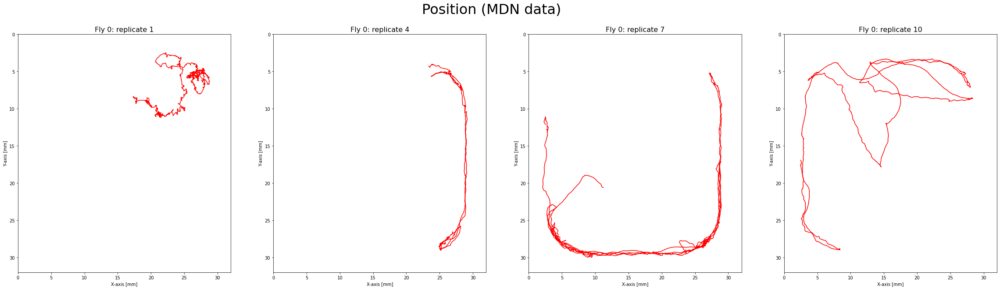

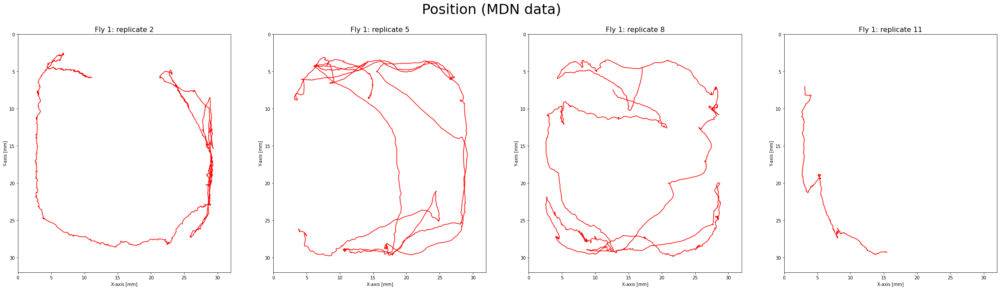

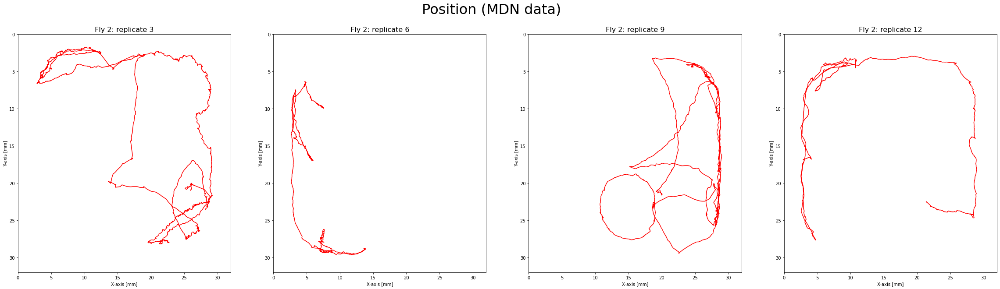

In [13]:
exp.plot_positions(fly = [0,1,2], MDN = True) # fly can be None, or a list of fly id (i.e. [0,2])

#### ii. SS data

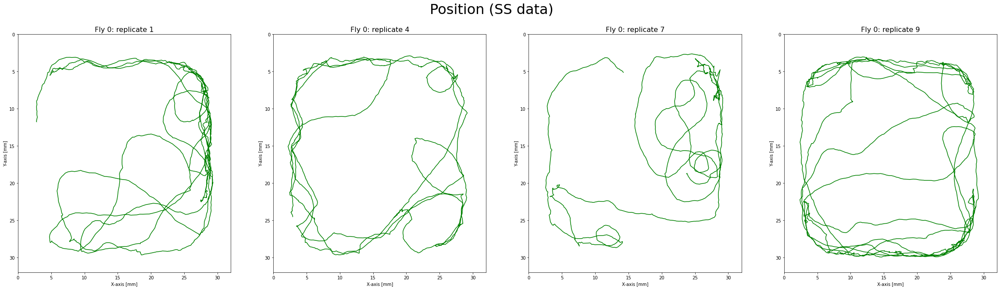

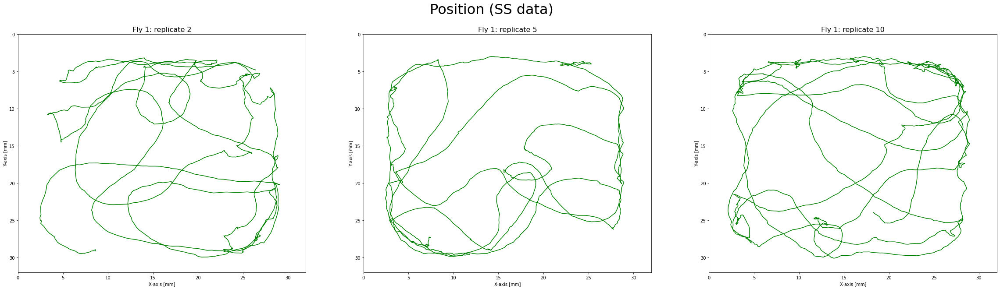

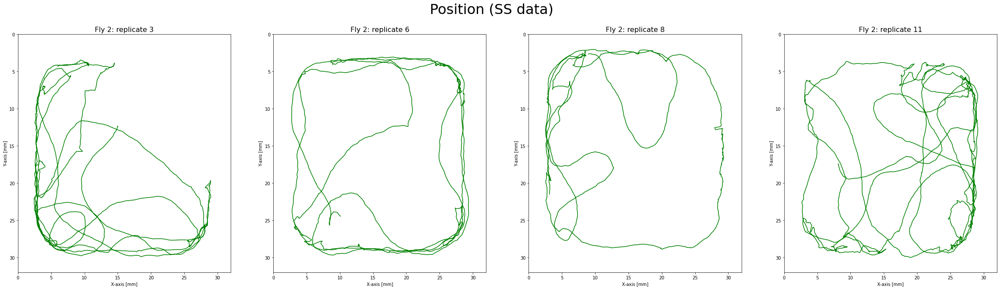

In [14]:
exp.plot_positions(fly = [0,1,2], SS = True) # fly can be None, or a list of fly id (i.e. [0,2])

#### iii. PR data

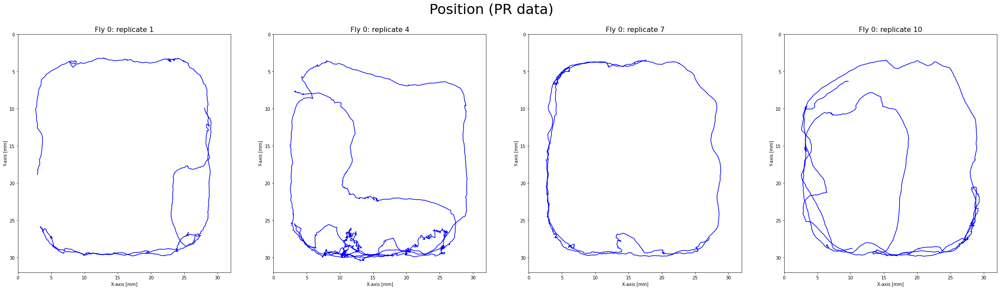

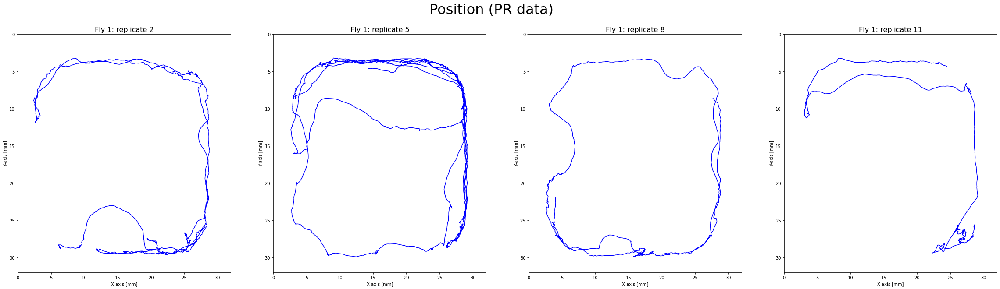

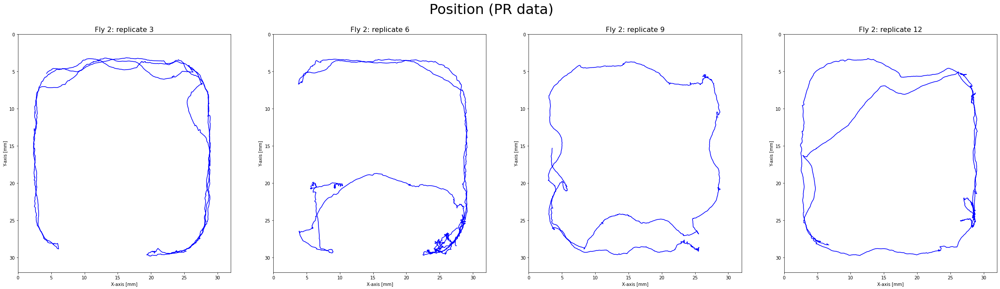

In [15]:
exp.plot_positions(fly = [0,1,2], PR = True) # fly can be None, of a list of fly id (i.e. [0,2])

## 2. Question 1b

### the forward / backward speed over time

In [16]:
moving_average = True
exp.width_mov_av_speed = 30
display_background = True 

In [17]:
exp.compute_pos_and_speed(moving_average = moving_average)

#### i. Data statistics

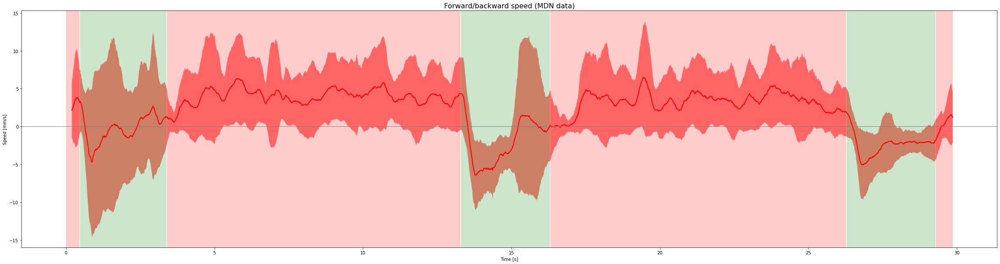

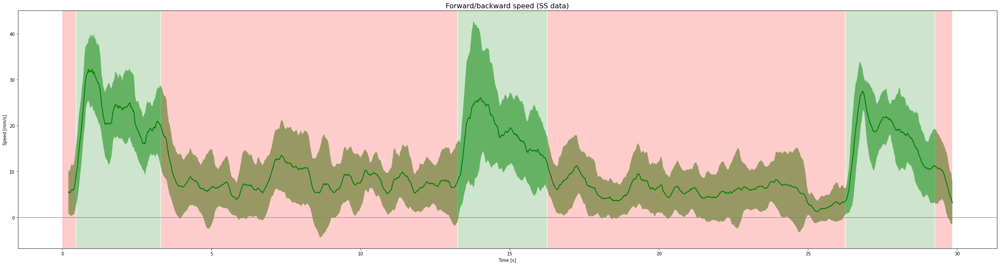

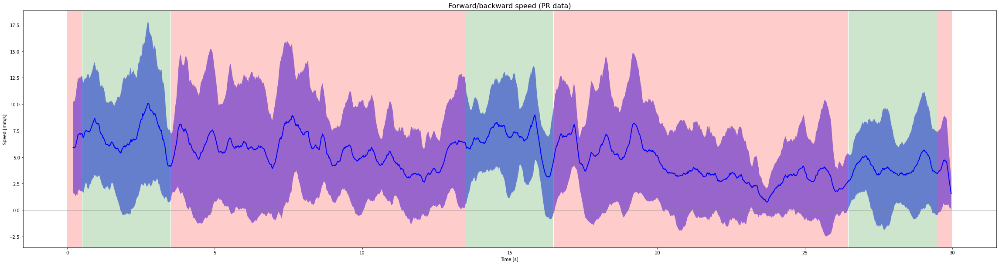

In [18]:
# fly = None will plot statistics (mean and std of all flies)
exp.plot_speeds(fly = None, MDN = True, SS = True, PR = True)

#### ii. MDN data

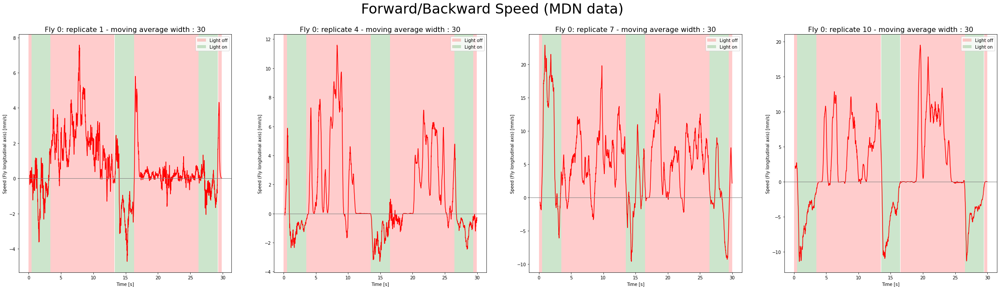

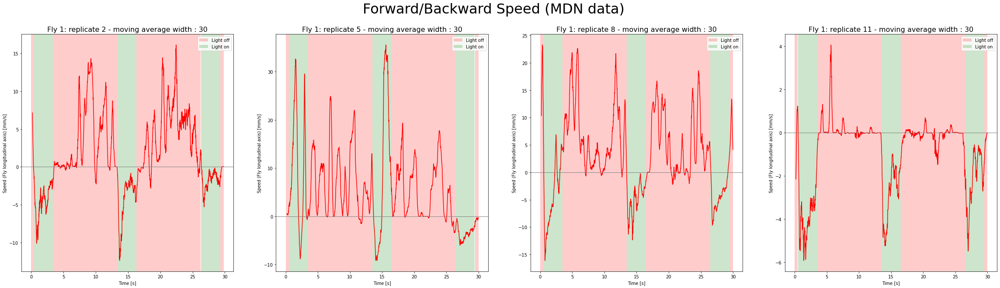

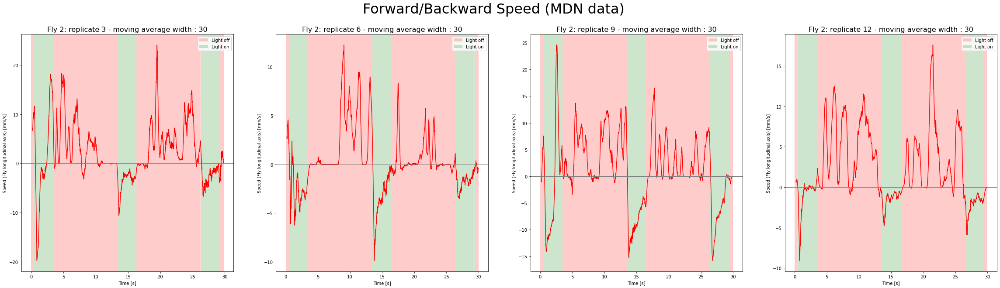

In [19]:
# fly can be None (statistics), or a list of fly id (i.e. [0,2])
exp.plot_speeds(fly = [0,1,2], MDN = True, display_background = display_background)

#### iii. SS data

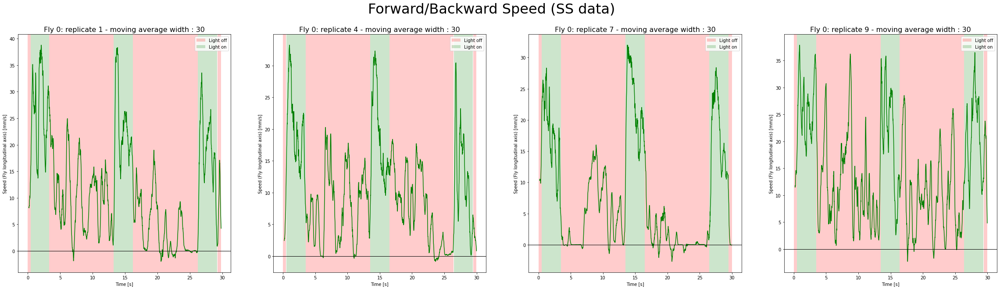

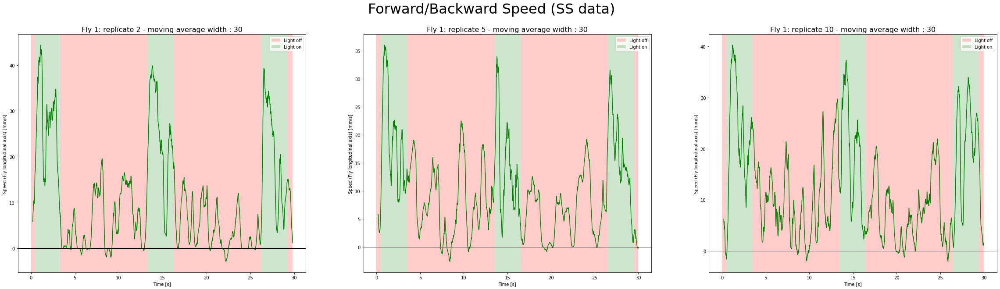

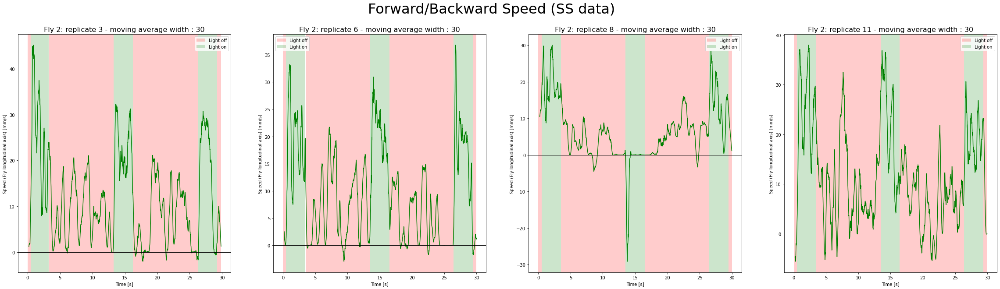

In [20]:
# fly can be None (statistics), or a list of fly id (i.e. [0,2])
exp.plot_speeds(fly = [0,1,2], SS = True, display_background = display_background)

#### iv. PR data

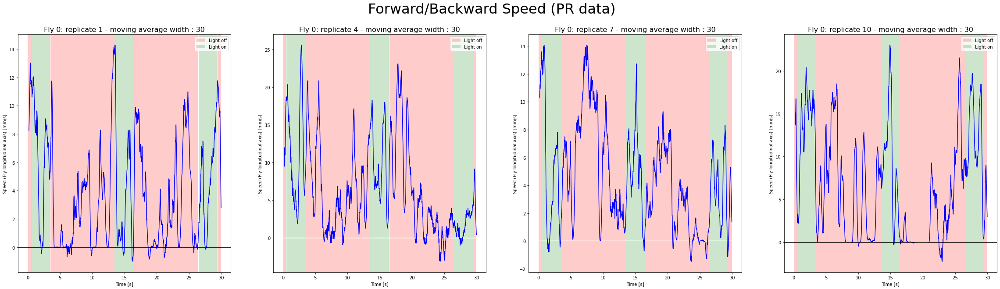

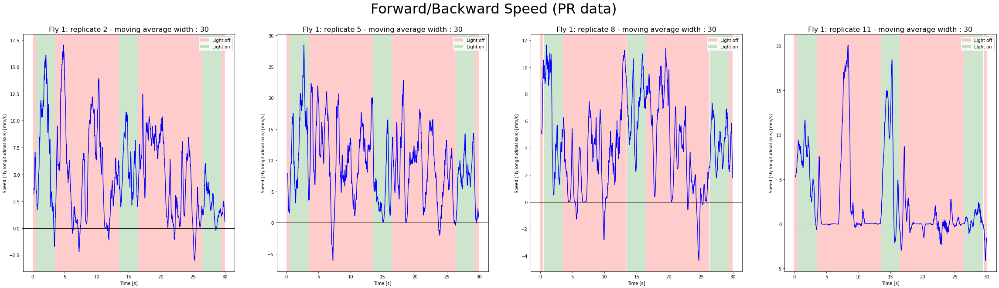

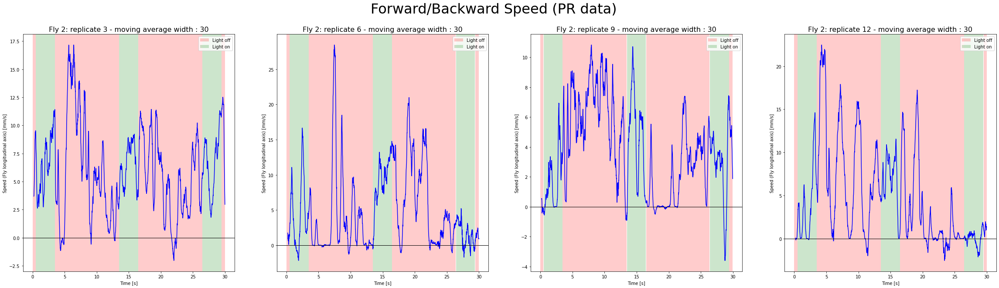

In [21]:
# fly can be None (statistics), or a list of fly id (i.e. [0,2])
exp.plot_speeds(fly = [0,1,2], PR = True, display_background = display_background)

### Angular speed over time

The results of this section doesn't give any information for our strain

In [22]:
moving_average = True
exp.width_mov_av_ang_speed = 30
display_background = True 

In [23]:
exp.compute_pos_and_speed(moving_average = moving_average)

#### i. MDN data

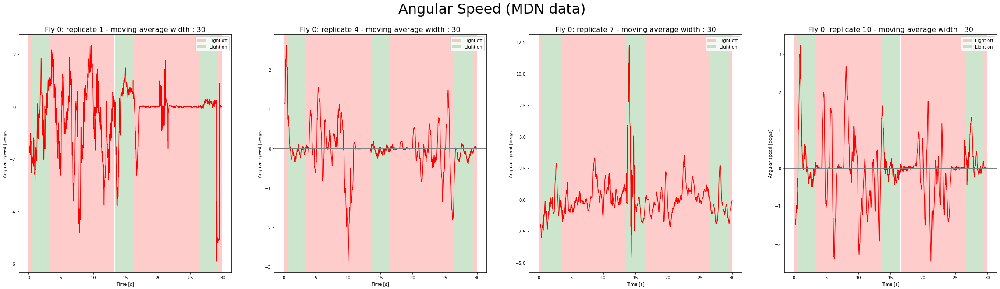

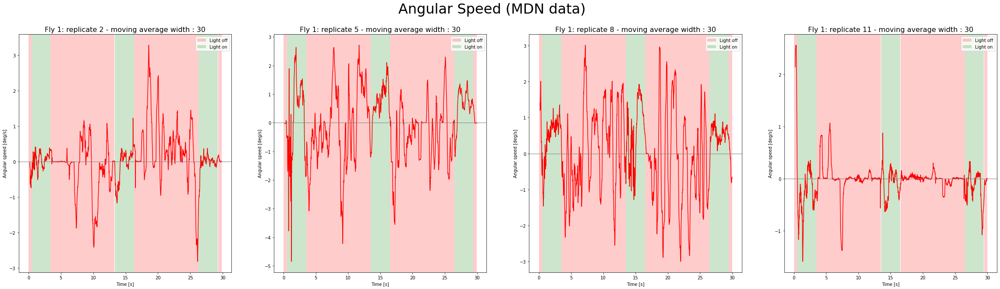

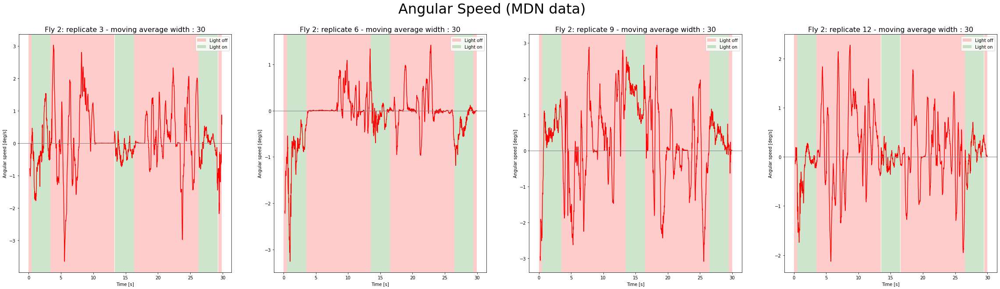

In [24]:
# fly can be None, or a list of fly id (i.e. [0,2])
exp.plot_angular_speeds(fly = [0,1,2], MDN = True, display_background = display_background)

#### ii. SS data

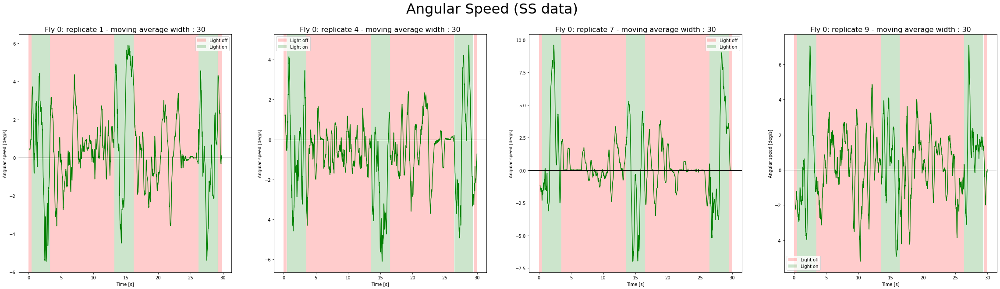

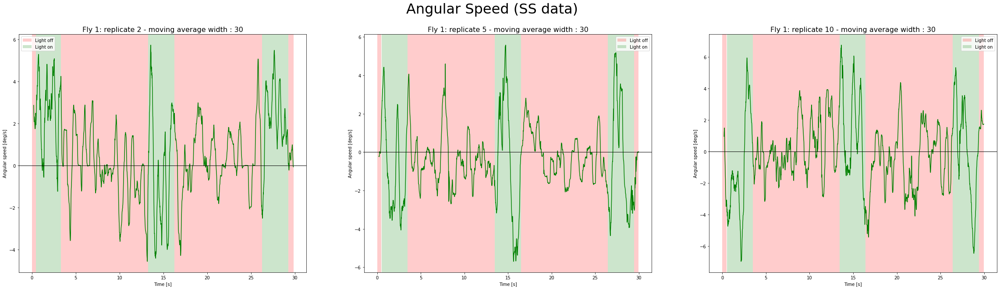

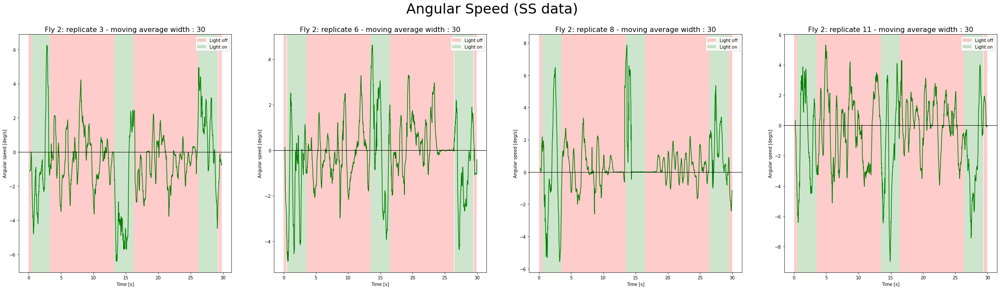

In [25]:
# fly can be None, or a list of fly id (i.e. [0,2])
exp.plot_angular_speeds(fly = [0,1,2], SS = True, display_background = display_background)

#### iii. PR data

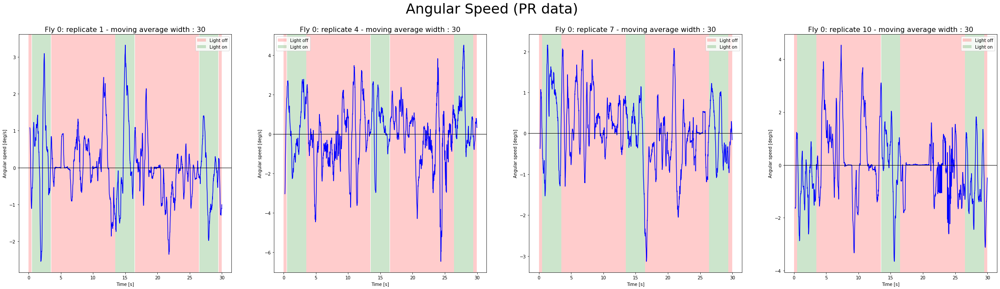

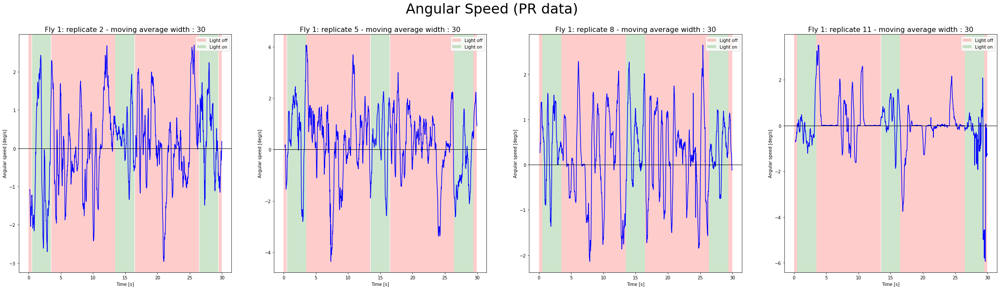

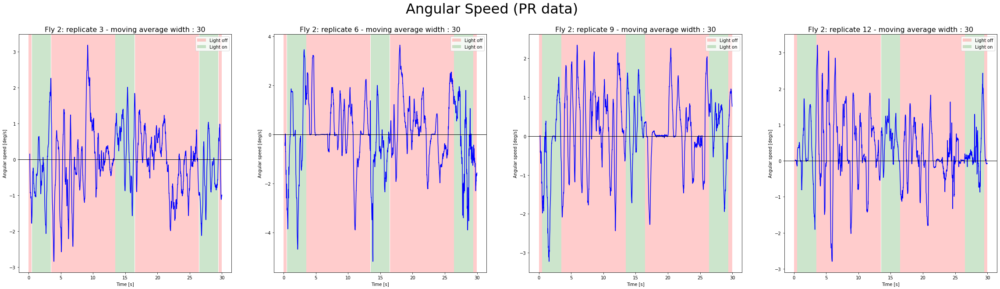

In [26]:
# fly can be None, or a list of fly id (i.e. [0,2])
exp.plot_angular_speeds(fly = [0,1,2], PR = True, display_background = display_background)

## Question 2.a

#### Claw position 

In [27]:
moving_average = True
exp.width_mov_av_claw = 30
display_background = True

In [28]:
exp.compute_claws(moving_average = moving_average)

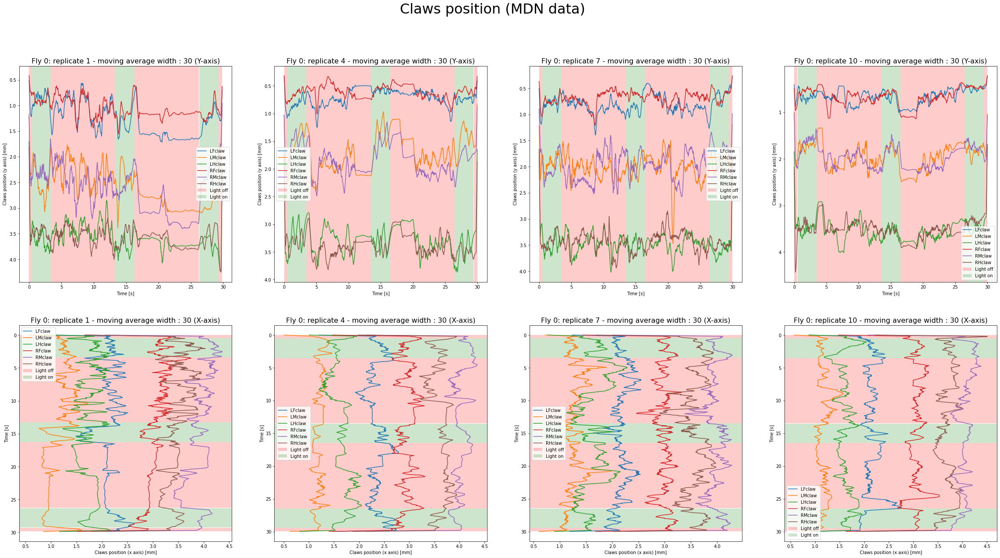

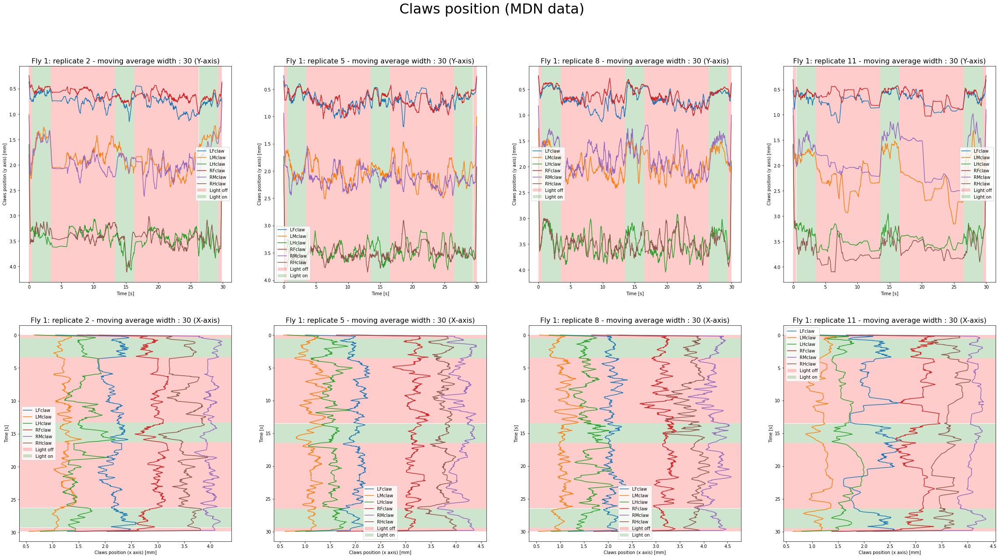

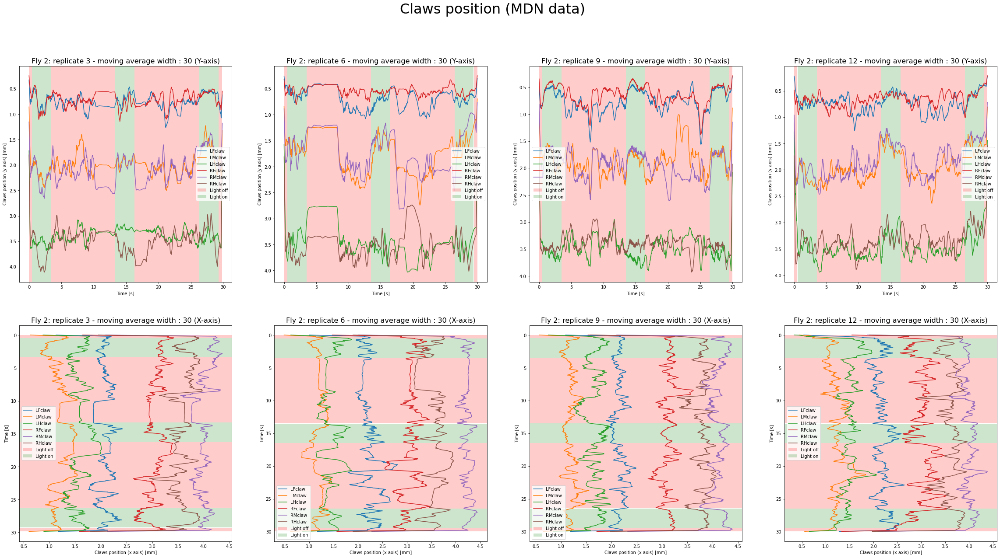

In [29]:
# fly can be None, of a list of fly id (i.e. [0,2])
exp.plot_claws(fly = [0,1,2], MDN = True, display_background = display_background)

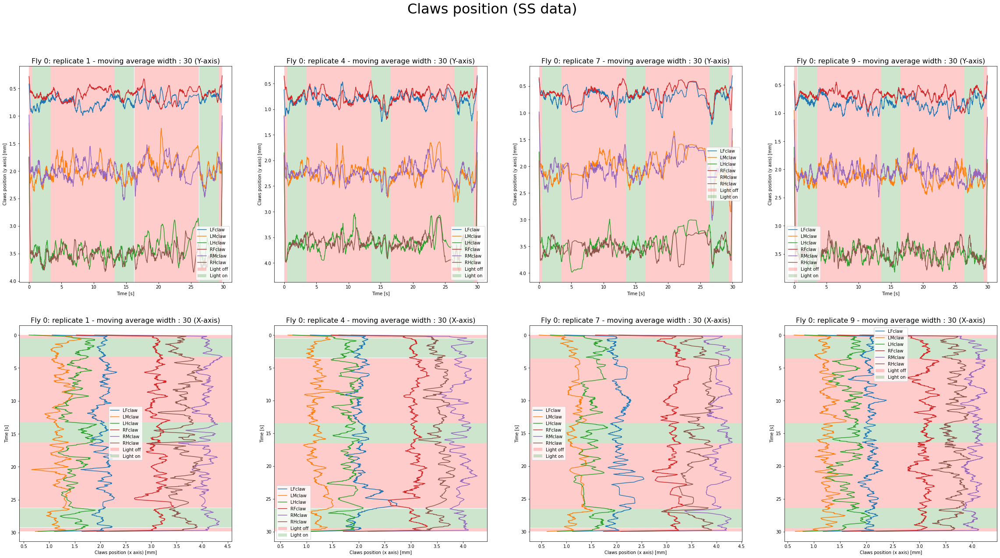

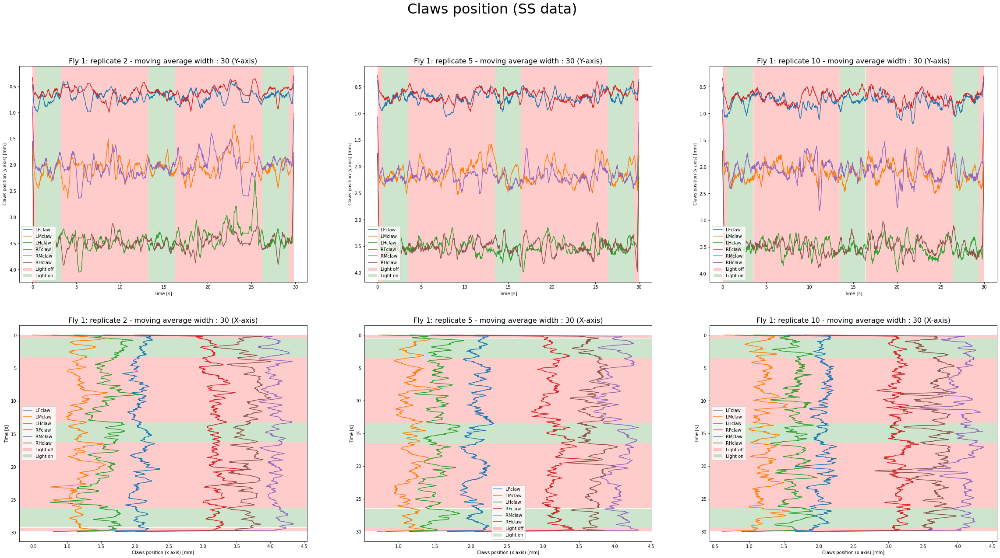

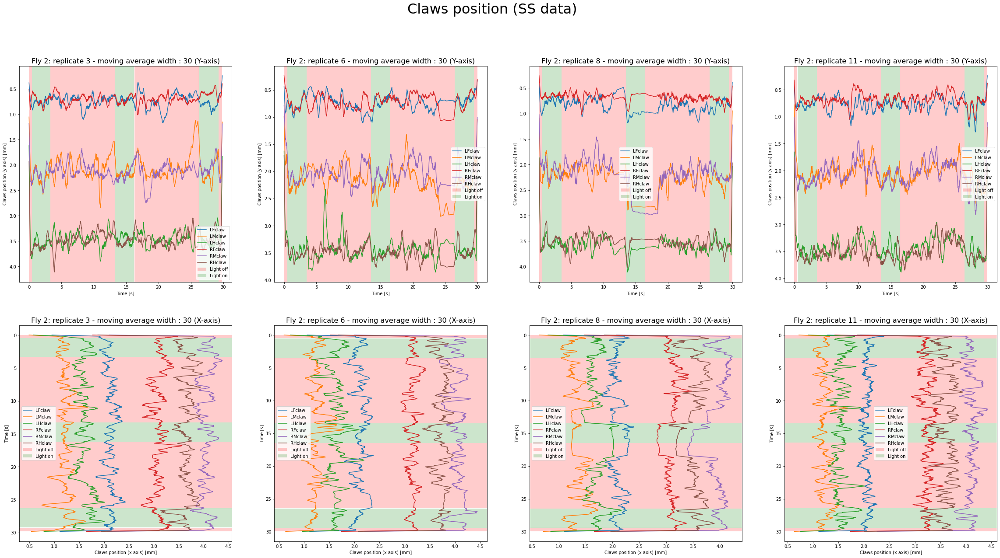

In [30]:
# fly can be None, of a list of fly id (i.e. [0,2])
exp.plot_claws(fly = [0,1,2], SS = True, display_background = display_background)

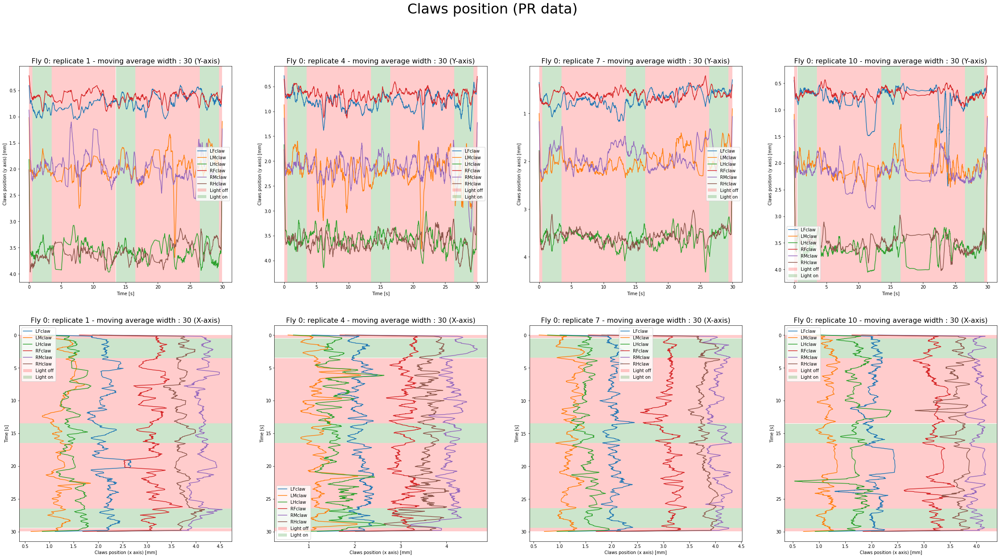

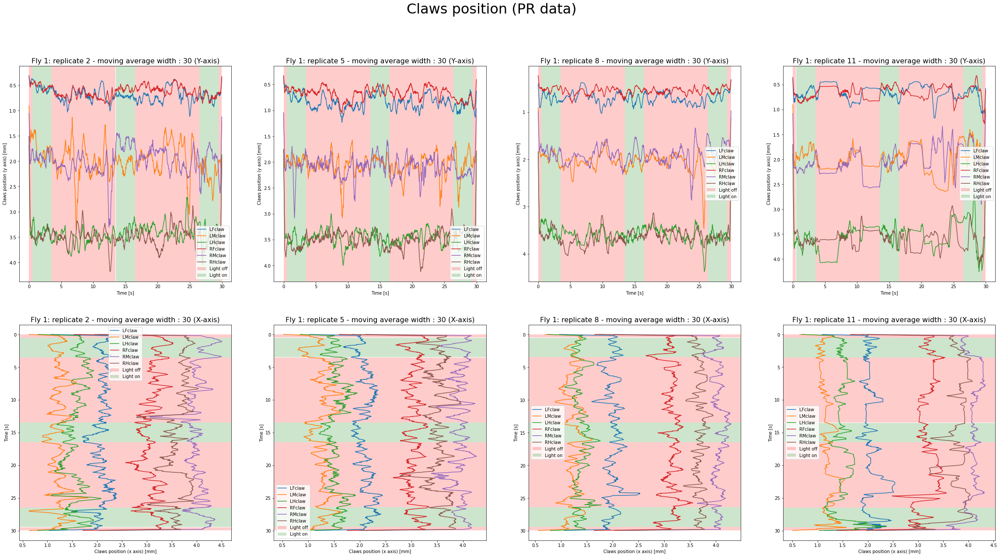

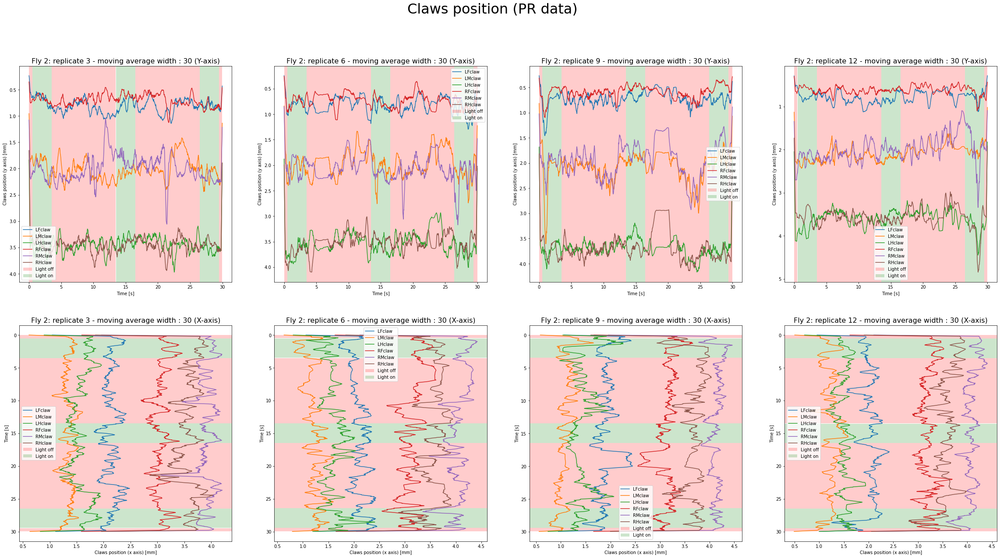

In [31]:
# fly can be None, of a list of fly id (i.e. [0,2])
exp.plot_claws(fly = [0,1,2], PR = True, display_background = display_background)

#### Claw frequency

In [32]:
moving_average = False
exp.width_mov_av_claw = 1

In [33]:
exp.compute_claws(moving_average = moving_average)

In [34]:
moving_average = True
exp.width_mov_av_claw_freq = 30
display_background = True

In [35]:
exp.compute_frequencies(moving_average = moving_average)

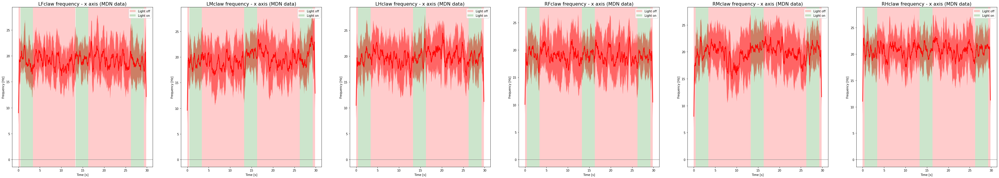

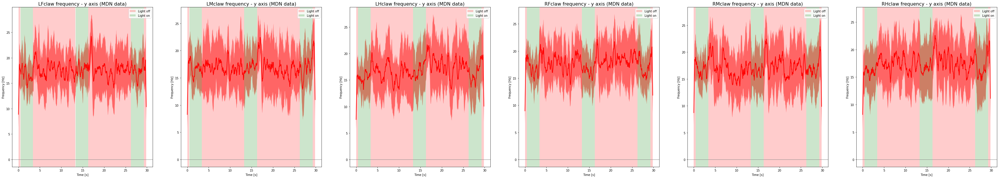

In [36]:
exp.plot_claw_frequeny(MDN = True, display_background = display_background)

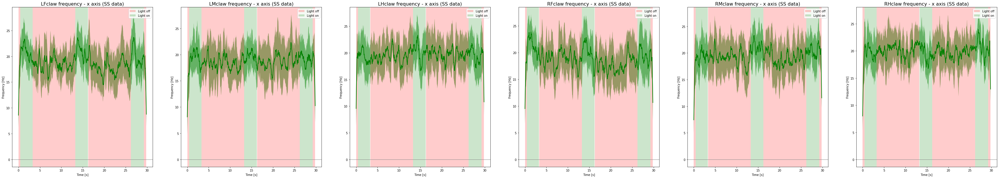

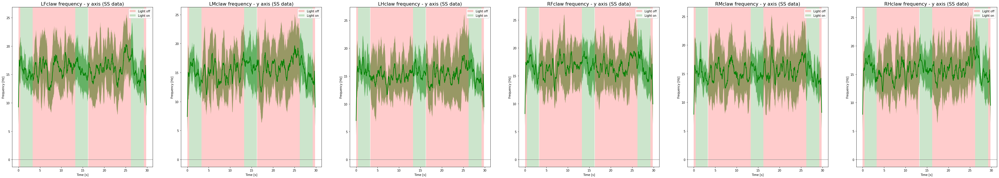

In [37]:
exp.plot_claw_frequeny(SS = True, display_background = display_background)

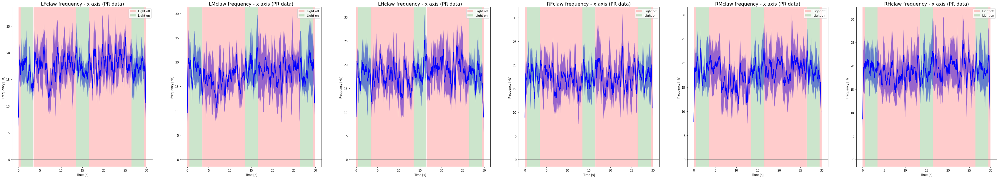

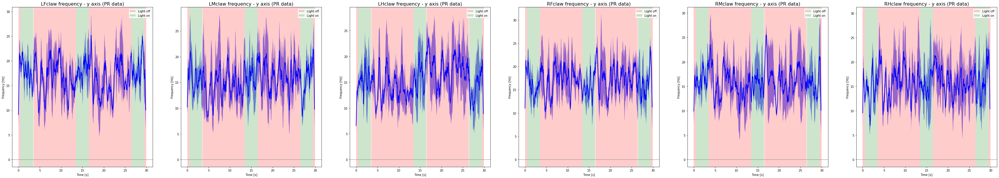

In [38]:
exp.plot_claw_frequeny(PR = True, display_background = display_background)

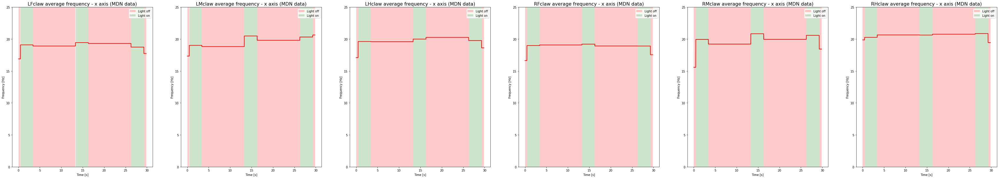

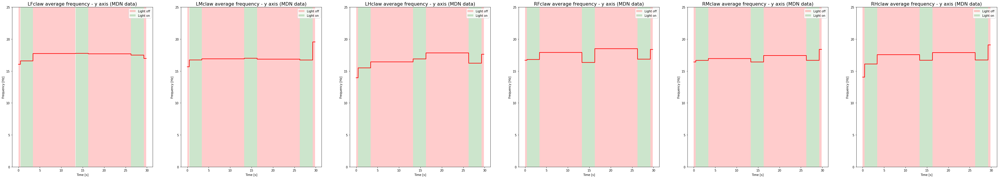

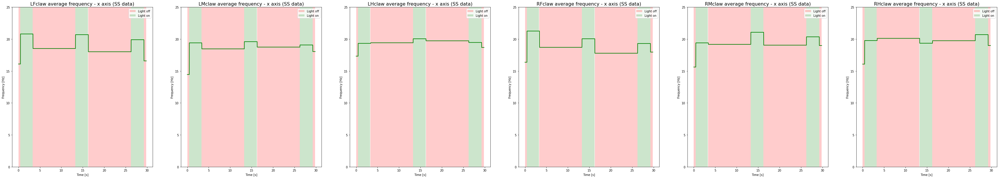

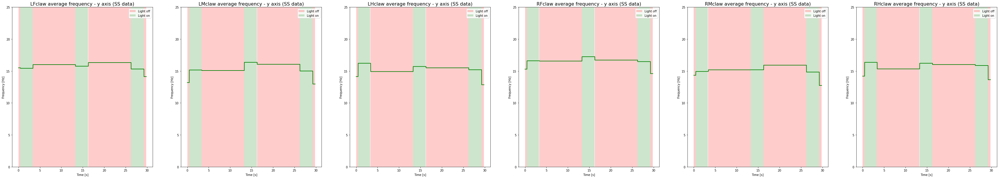

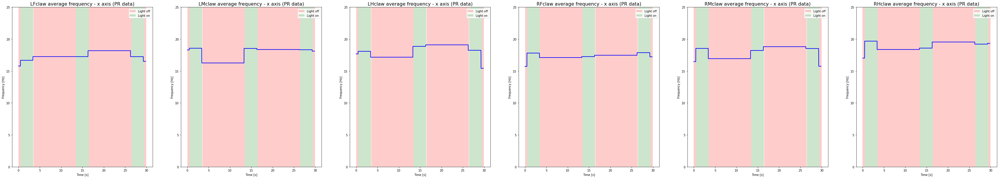

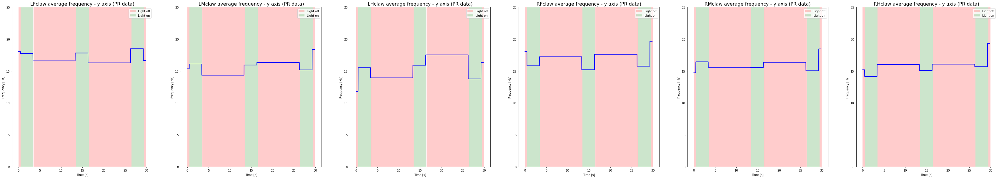

In [39]:
exp.plot_frequency_average(MDN = True, SS = True, PR = True, display_background = True)

## Clustering

In [40]:
def load_data():
    """ Load data of all intersting strain in good format for clustering """
    path_MDN = 'data/MDN/U3_f'
    paths_SS = ['SS01049', 'SS01054', 'SS01540',\
               'SS02111', 'SS02279', 'SS02377', 
               'SS02608', 'SS02617']
    with open(path_MDN + '/MDN_U3_f_trackingData.pkl', 'rb') as f: 
        data_MDN = pickle.load(f).reset_index()
        data_MDN['strain'] = pd.Series('MDN', index=data_MDN.index)
        datas = data_MDN
    for path_SS in paths_SS:
        p = 'data/' + path_SS + '/U3_f/'
        with open(p + path_SS +'_U3_f_trackingData.pkl', 'rb') as f: 
            data_SS = pickle.load(f).reset_index()
            data_SS['strain'] = pd.Series(path_SS, index=data_SS.index)
            datas = datas.append(data_SS)
    return datas

In [41]:
claws_name = ['LFclaw', 'LMclaw', 'LHclaw', 'RFclaw', 'RMclaw', 'RHclaw']
data_raw = load_data()

In [42]:
# Extract only on2 stages and meaningful informations
data = data_raw[data_raw['exp_stage'] == 'on2'][['strain']+claws_name].reset_index()
data = data[['strain']+claws_name]

#### Wavelet transform

In [43]:
wavelet_data = pd.DataFrame()
list_flies = [data[data['strain'] == s][claws_name] for s in data['strain'].unique()]
for fly_data in list_flies:
    legs_data = pd.DataFrame()
    for leg in fly_data:
        # Calculate signal wavelets
        sig = signal.cwt(fly_data[leg][:2600], signal.morlet, widths = np.linspace(1, 40, 25, dtype=np.int64))
        # Take the modulus of the imaginary numbers
        sig = abs(sig).transpose()
        # Convert in good format
        for j in range(25):
            legs_data['{}-{}'.format(leg, j)] = pd.Series(sig[:, j])
    wavelet_data = wavelet_data.append(legs_data)


In [44]:
wavelet_data_np = wavelet_data.to_numpy()

#### t-SNE

In [45]:
tsne_wave = TSNE(n_components=2)
data_reduced_wave = tsne_wave.fit_transform(wavelet_data_np)

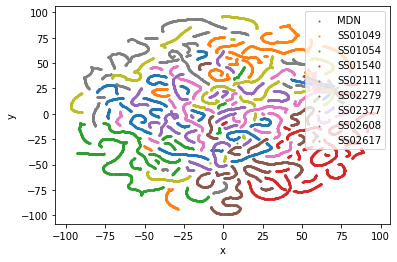

In [52]:
strains = data['strain'].unique()
for i, s in enumerate(strains):
    plt.scatter(data_reduced_wave[i*2600:(i+1)*2600,0], data_reduced_wave[i*2600:(i+1)*2600,1], s=1, label=s)
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.show()

#### Seaplot

/Users/artur/anaconda3/envs/cv/lib/python3.7/site-packages/seaborn/distributions.py:434: UserWarning: The following kwargs were not used by contour: 'xlim', 'ylim'
  cset = contour_func(xx, yy, z, n_levels, **kwargs)


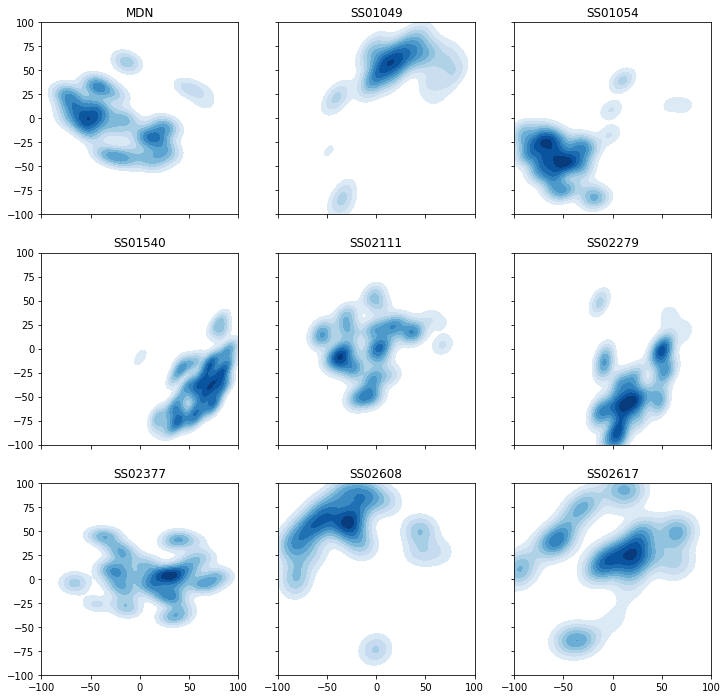

In [54]:
fig, axes = plt.subplots(3, 3, figsize=(12, 12), sharex=True, sharey=True)
strains = data['strain'].unique()
for i, s in enumerate(strains):
    idx = [data[data['strain'] == s].index[id_] for id_ in [0, -1]]
    axes[i//3, i%3].set_title(s)
    axes[i//3, i%3].set_xlim(-100, 100)
    axes[i//3, i%3].set_ylim(-100, 100)
    axes[i//3, i%3] = sns.kdeplot(data=data_reduced_wave[i*2600:(i+1)*2600,0], data2=data_reduced_wave[i*2600:(i+1)*2600,1], \
                                  ax=axes[i//3, i%3], shade=True, xlim=(-100, 100), ylim=(-100, 100), \
                                  shade_lowest=False, cmap="Blues")

